In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(color_codes=True)
import scipy as sp
import numpy as np
import math
import torch_geometric
import geopandas as gpd
import pandas as pd
import osmnx as ox
import momepy
import fiona
import networkx as nx
import networkx.algorithms.community as nx_comm

from utils.visualization import visualize_graph, visualize_nx
from utils.load_geodata import load_graph, load_gdf
from utils.load_data import load_gva_df, load_deprivation_df
from utils.constants import project_root, dataset_root
from utils.constants import rank_fields, log_fields, ignore_fields, all_feature_fields, included_places

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
!nvidia-smi

/vol/bitbucket/wwc4618/venv/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


Thu May  5 22:13:29 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.103.01   Driver Version: 470.103.01   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:01:00.0 Off |                  N/A |
| 30%   26C    P8     5W / 180W |     87MiB /  8119MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Node-level Clustering

/homes/wwc4618/predicting-choice/utils/remove_false_nodes.py:92: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return df.append(


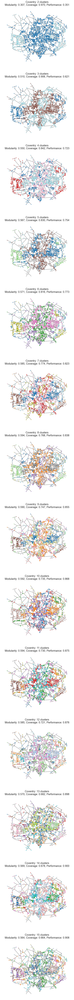

IndexError: list index out of range

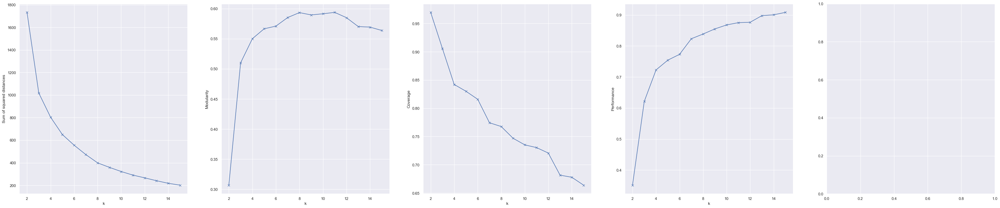

In [18]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

def cluster(ssx_dataset, place, clean,
            data_to_cluster=None, 
            Ks=range(2,10), 
            include_feats=rank_fields,
            show_map=True):
    X = [data.x for data in ssx_dataset if data.place == place][0]
    if data_to_cluster is None:
        # Get cluster data from ssx dataset
        feats = ssx_dataset[0].node_attrs
        feat_idx = torch.tensor([feats.index(feat) for feat in include_feats])
        data_to_cluster = torch.index_select(X, 1, feat_idx) if len(feat_idx) > 0 else None
    else:
        # Cluster data should have same length as ssx data (same number of nodes
        assert len(data_to_cluster) == len(X)
    
    streets = load_graph(place, clean=clean, return_nx=True)
    float32_node_dict = {(torch.tensor(c[0], dtype=torch.float32).item(),
                          torch.tensor(c[1], dtype=torch.float32).item()): c for c in streets}
    
    errors, modularities, covs, perfs, scores = [], [], [], [], []
    if show_map:
        f, ax = plt.subplots(len(Ks), 1, figsize=(10, len(Ks) * 10), sharex=True, sharey=True)
    for idx, k in enumerate(Ks):
        km = KMeans(n_clusters=k, random_state=0)
        km = km.fit(data_to_cluster)
        errors.append(km.inertia_)
        
        label_dict = {} # For assigning attributes
        label_to_nodes_dict = {k: [] for k in range(k)} # To compute modularity
        # Iterate over each node and add its designated label to the nx graph
        for i, label in enumerate(km.labels_):
            # Get node coordinates (the last two node attributes in pretransformed data)
            coords = X[i, -2].item(), X[i, -1].item()
            # Convert them into their full precision node coordinates
            coords = float32_node_dict[coords]
            label_dict[coords] = label
            label_to_nodes_dict[label].append(coords)
        partition = list(label_to_nodes_dict.values())
        # Compute modularity
        mod = nx_comm.modularity(streets, partition)
        # Compute coverage and performance
        cov, perf = nx_comm.partition_quality(streets, partition)
        # Compute score
        # score = partition_score(streets, partition)
        
        modularities.append(mod)
        covs.append(cov)
        perfs.append(perf)
        # scores.append(score)
        
        if show_map:
            # Set attributes on the original graph
            nx.set_node_attributes(streets, label_dict, 'label')

            # Plot original graph, coloring nodes as per their assigned label
            colors = [node[1]['label'] for node in streets.nodes(data=True)]
            axis = ax[idx] if len(Ks) > 1 else ax
            axis.set_title(f'{place}: {k} clusters\n'
                           f'Modularity: {mod:.3f}, Coverage: {cov:.3f}, Performance: {perf:.3f}',
                          fontsize=20)
            nx.draw(streets, {n:[n[0], n[1]] for n in list(streets.nodes)},
                    node_size=10, node_color=colors, cmap='tab20', ax=axis)
    if show_map:
        plt.show()
    f, axs = plt.subplots(1, 5, figsize=(50, 10))
    stat_dicts = [
        {'stat': 'Sum of squared distances', 'data': errors},
        {'stat': 'Modularity', 'data': modularities},
        {'stat': 'Coverage', 'data': covs},
        {'stat': 'Performance', 'data': perfs},
        # {'stat': 'Scores', 'data': scores}
    ]
    for i, ax in enumerate(axs):
        stat_dict = stat_dicts[i]
        ax.plot(Ks, stat_dict['data'], 'bx-')
        ax.set_xlabel('k')
        ax.set_ylabel(stat_dict['stat'])
    plt.tight_layout()
    plt.show()
    return modularities

def plot_latent_clusters(place, clean=True, show_map=True, Ks=None, tsne_n=0):
    if clean:
        ssx_dataset = torch.load(f'{dataset_root}/ssx_dataset_clean.pt')
        link_pred_dataset = torch.load(f'{dataset_root}/clean_link_pred.pt')[1]
        link_pred_data = link_pred_dataset[place]['z'].detach().cpu()
    else:
        ssx_dataset = torch.load(f'{dataset_root}/ssx_dataset_connected.pt')
        link_pred_dataset_a = torch.load(f'{dataset_root}/link_pred_metrics_full_GAIN_iter1.pt')
        link_pred_dataset_b = torch.load(f'{dataset_root}/link_pred_metrics_full_GAIN_iter2.pt')
        link_pred_dataset = {**link_pred_dataset_a, **link_pred_dataset_b}
        link_pred_data = link_pred_dataset[place]['encoding'][0].detach().cpu()
    if tsne_n > 0:
        tsne = TSNE(n_components=tsne_n, learning_rate='auto', init='random')
        link_pred_data = tsne.fit_transform(link_pred_data)
    mods = cluster(ssx_dataset, place, clean, show_map=show_map, data_to_cluster=link_pred_data, Ks=Ks)
    return mods
    
def plot_ssx_clusters(place, include_feats=rank_fields, Ks=None):
    ssx_dataset = torch.load(f'{dataset_root}/ssx_dataset_connected.pt')
    mods = cluster(ssx_dataset, place, Ks=Ks, include_feats=include_feats)
    return mods

"""
Test Code
"""
Ks = range(2, 16)
for place in ['Coventry']:
    # plot_ssx_clusters(place, Ks=range(2,11))
    plot_latent_clusters(place, Ks=Ks, show_map=True)


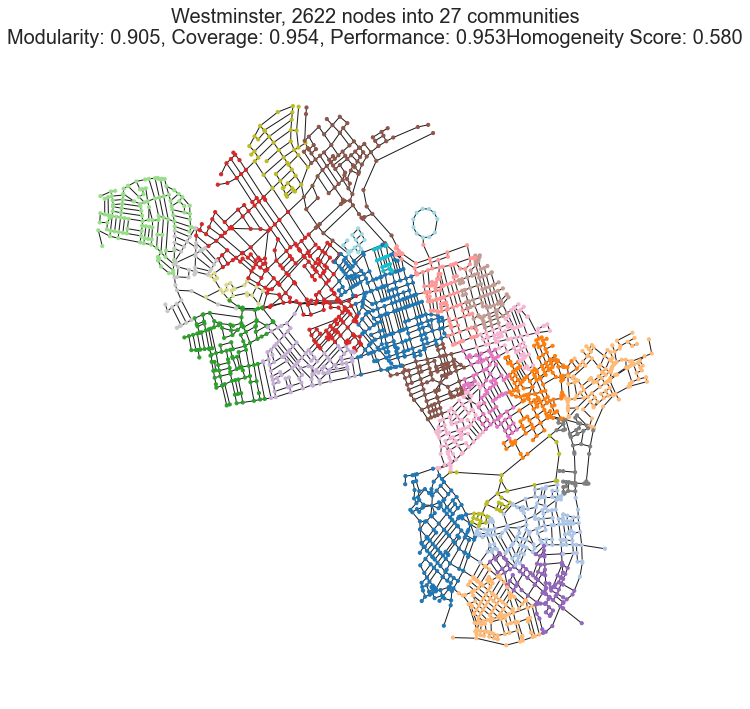

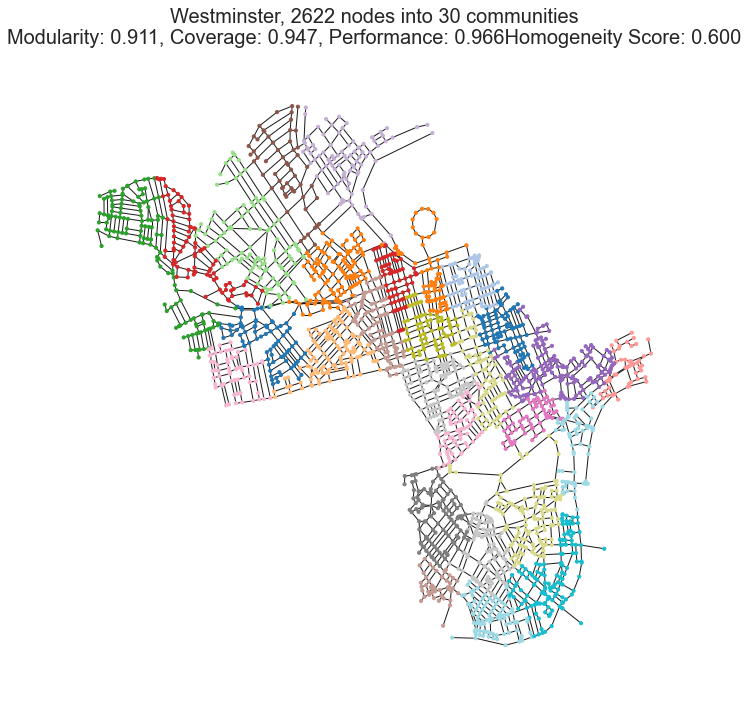

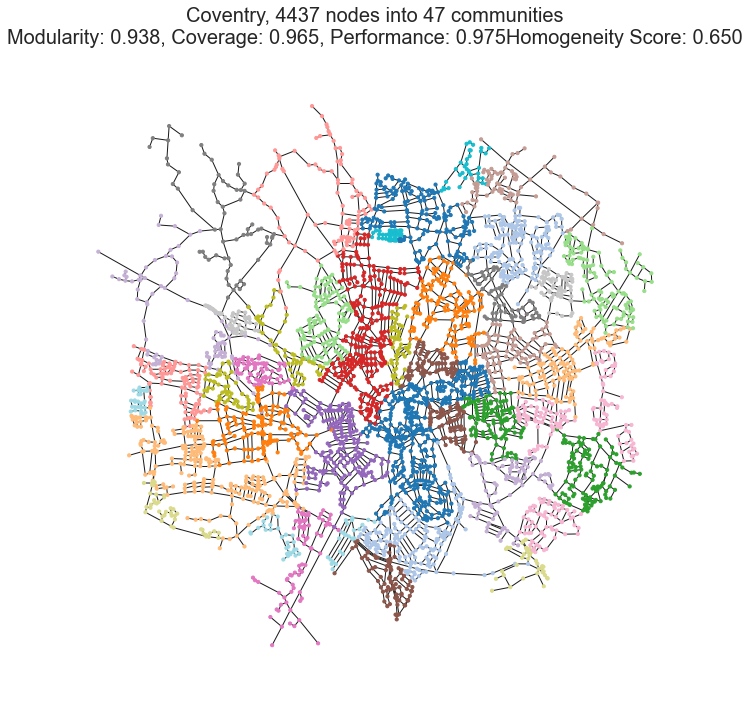

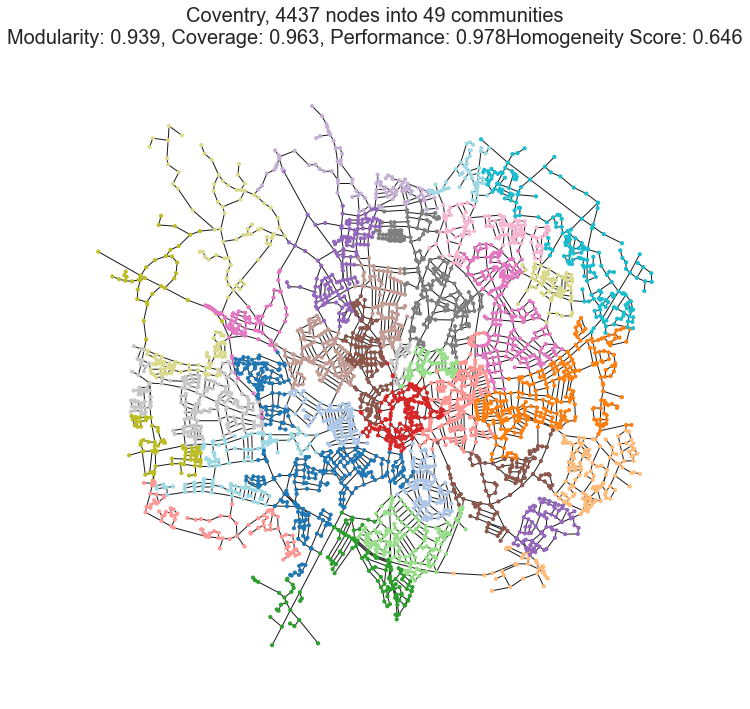

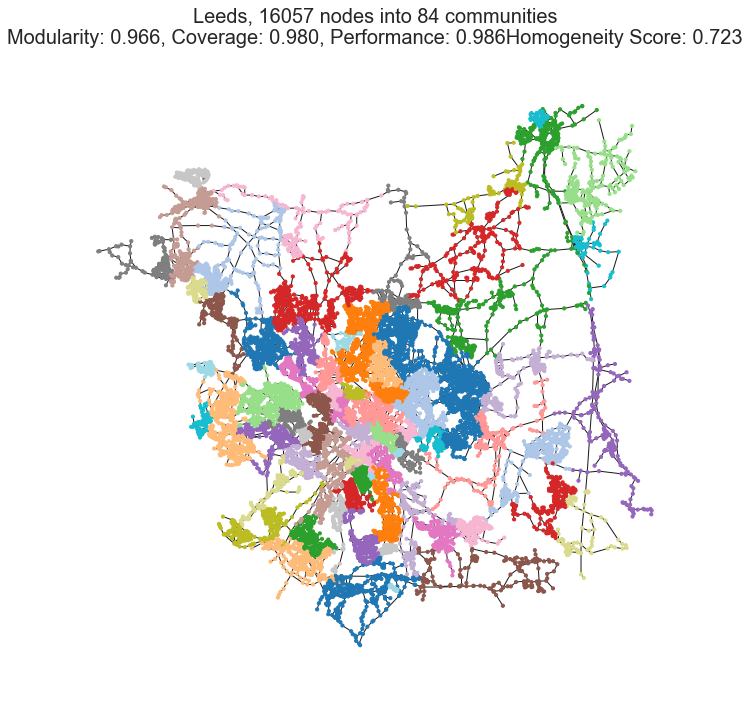

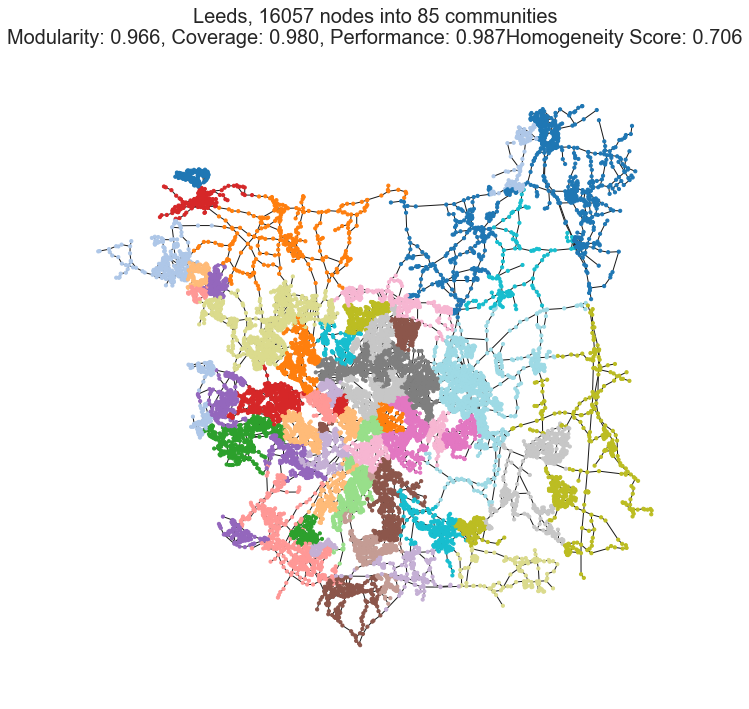

In [17]:
def plot_communities(place, comm_algo='louvain'):
    G = load_graph(place, clean=False, return_nx=True, reset=True)
    if comm_algo == 'greedy':
        comms = nx_comm.greedy_modularity_communities(G)
    elif comm_algo == 'louvain':
        comms = nx_comm.louvain_communities(G)
    else:
        comms = girvan_newman(G)
    label_dict = {}
    for i, comm in enumerate(comms):
        for node in comm:
            label_dict[node] = i
    nx.set_node_attributes(G, label_dict, 'label')

    colors = [node[1]['label'] for node in G.nodes(data=True)]
    mod = nx_comm.modularity(G, comms)
    cov, perf = nx_comm.partition_quality(G, comms)
    score = partition_score(G, comms)
    plt.figure(figsize=(12,12)) 
    plt.title(f'{place}, {G.number_of_nodes()} nodes into {len(comms)} communities\n'
        f'Modularity: {mod:.3f}, Coverage: {cov:.3f}, Performance: {perf:.3f}, '
        f'Homogeneity Score: {score:.3f}', fontsize=20)
    
    nx.draw(
        G, 
        {n:[n[0], n[1]] for n in list(G.nodes)}, 
        node_size=10,
        node_color=colors,        
        cmap='tab20'
    )
    plt.show()

def plot_lsoa(place):
    ignore_fields_lsoa = [field for field in ignore_fields if field != 'lsoa11nm']
    gdf = load_gdf(place, reset=False, clean=False, ignore_fields=ignore_fields_lsoa)
    fig, ax = plt.subplots(1, 1, figsize=(10,10))
    gdf.plot(ax=ax, column='lsoa11nm')
    ax.axis('off')
    # gdf.apply(lambda x: ax.annotate(text=x['lsoa11nm'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1);
    plt.title(f'{place}, LSOAs', fontsize=20)
    plt.show()

"""
Test Code
"""
place = 'Poole'
for place in ['Westminster', 'Coventry', 'Leeds']:
    plot_communities(place, comm_algo='greedy')
    plot_communities(place, comm_algo='louvain')
    # plot_lsoa(place)

# DBSCAN

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(2624, 2)
(2624, 2)
Graph with 2624 nodes and 3213 edges
Executing DBSCAN with distance 2000 and num_samples 2


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing DBSCAN with distance 2000 and num_samples 3
Executing DBSCAN with distance 2000 and num_samples 4


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing DBSCAN with distance 2000 and num_samples 5
Executing DBSCAN with distance 2000 and num_samples 6


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


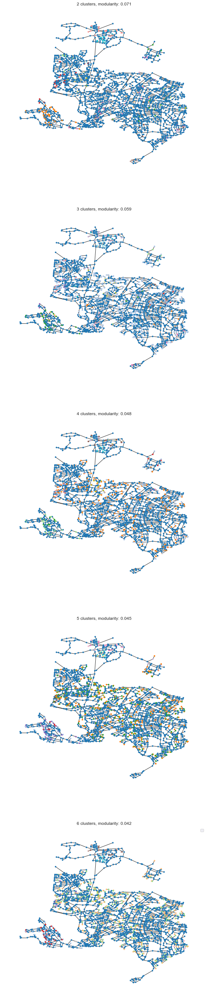

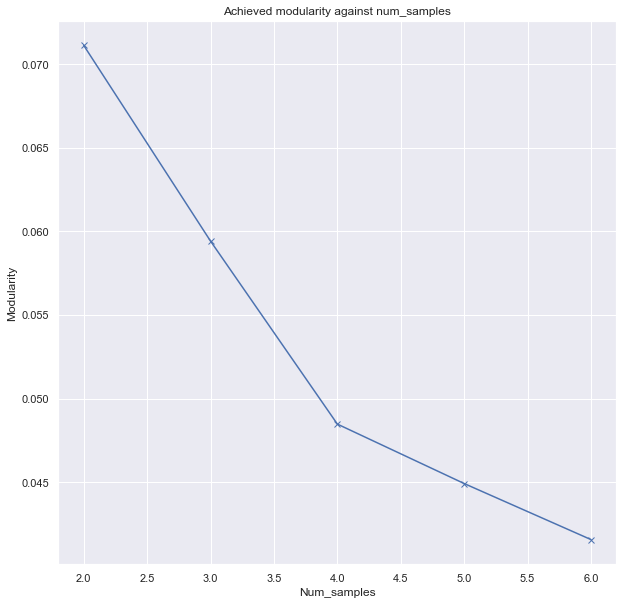

In [26]:
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE

def dbscan(ssx_dataset, place, data_to_cluster=None, eps=0.5, Ks=range(2,10), include_feats=rank_fields):
    X = [data.x for data in ssx_dataset if data.place == place][0]
    if data_to_cluster is None:
        # Get cluster data from ssx dataset
        feats = ssx_dataset[0].node_attrs
        feat_idx = torch.tensor([feats.index(feat) for feat in include_feats])
        data_to_cluster = torch.index_select(X, 1, feat_idx) if len(feat_idx) > 0 else None
    else:
        # Cluster data should have same length as ssx data (same number of nodes
        print(data_to_cluster.shape)
        assert len(data_to_cluster) == len(X)
    
    streets = load_graph(place, clean=False, return_nx=True, reset=False)
    float32_node_dict = {(torch.tensor(c[0], dtype=torch.float32).item(),
                          torch.tensor(c[1], dtype=torch.float32).item()): c for c in streets}
    
    errors = []
    modularities = []
    f, ax = plt.subplots(len(Ks), 1, figsize=(10, len(Ks) * 10), sharex=True, sharey=True)
    for ep in eps:
    for idx, k in enumerate(Ks):
        print(f'Executing DBSCAN with distance {eps} and num_samples {k}')
        dbscan = DBSCAN(eps=eps, min_samples=k).fit(X)
        
        label_dict = {} # For assigning attributes
        label_to_nodes_dict = {} # For computing modularity
        # Iterate over each node and add its designated label to the nx graph
        for i, label in enumerate(dbscan.labels_):
            # Get node coordinates (the last two node attributes in pretransformed data)
            coords = X[i, -2].item(), X[i, -1].item()
            # Convert them into their full precision node coordinates
            coords = float32_node_dict[coords]
            label_dict[coords] = label
            if label in label_to_nodes_dict:
                label_to_nodes_dict[label].append(coords)
            else:
                label_to_nodes_dict[label] = [coords]
        # Compute modularity
        mod = nx_comm.modularity(streets, list(label_to_nodes_dict.values()))
        modularities.append(mod)
        
        # Set attributes on the original graph
        nx.set_node_attributes(streets, label_dict, 'label')

        # Plot original graph, coloring nodes as per their assigned label
        colors = [node[1]['label'] for node in streets.nodes(data=True)]
        axis = ax[idx] if len(Ks) > 1 else ax
        axis.set_title(f'{k} clusters, modularity: {mod:.3f}')
        plt.legend()
        nx.draw(streets, {n:[n[0], n[1]] for n in list(streets.nodes)}, node_size=10, node_color=colors, cmap='tab20', ax=axis)
    
    plt.show()
    f, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.plot(Ks, modularities, 'bx-')
    ax.set_xlabel('Num_samples')
    ax.set_ylabel('Modularity')
    ax.set_title('Achieved modularity against num_samples')
    plt.show()

place = 'Poole'
ssx_dataset = torch.load(f'{dataset_root}/ssx_dataset_connected.pt')
link_pred_dataset_a = torch.load(f'{dataset_root}/link_pred_metrics_full_GAIN_iter1.pt')
link_pred_dataset_b = torch.load(f'{dataset_root}/link_pred_metrics_full_GAIN_iter2.pt')
link_pred_dataset = {**link_pred_dataset_a, **link_pred_dataset_b}
link_pred_data = link_pred_dataset[place]['encoding'][0].detach().cpu()

link_pred_data = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(link_pred_data)
print(link_pred_data.shape)
dbscan(ssx_dataset, place, data_to_cluster=link_pred_data, eps=2000, Ks=range(2, 7))

# METIS

/homes/wwc4618/predicting-choice/utils/remove_false_nodes.py:92: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return df.append(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 2
Executing METIS with parts 3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 4
Executing METIS with parts 5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 6


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 7
Executing METIS with parts 8


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 9
Executing METIS with parts 10


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 11
Executing METIS with parts 12


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 13
Executing METIS with parts 14


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 15
Executing METIS with parts 16


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 17
Executing METIS with parts 18


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Executing METIS with parts 19


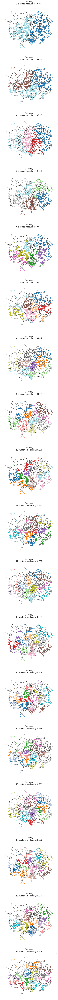

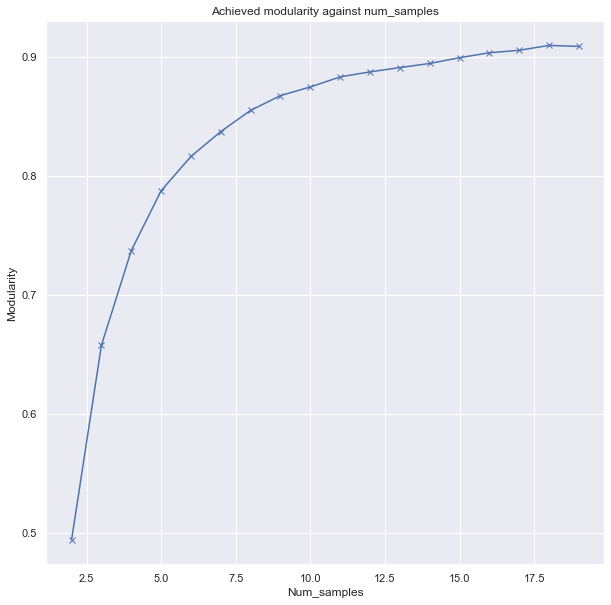

In [16]:
import metis


def metis_cluster(ssx_dataset, place, data_to_cluster=None, Ks=range(2,10), include_feats=rank_fields):
    streets = load_graph(place, clean=True, return_nx=True)
    float32_node_dict = {(torch.tensor(c[0], dtype=torch.float32).item(),
                          torch.tensor(c[1], dtype=torch.float32).item()): c for c in streets}
    
    errors = []
    modularities = []
    f, ax = plt.subplots(len(Ks), 1, figsize=(10, len(Ks) * 10), sharex=True, sharey=True)
    for idx, k in enumerate(Ks):
        print(f'Executing METIS with parts {k}')
        (edgecuts, parts) = metis.part_graph(streets, k)
        label_dict = {} # For assigning attributes
        label_to_nodes_dict = {} # For computing modularity
        # Iterate over each node and add its designated label to the nx graph
        for i, coords in enumerate(streets.nodes()):
            label = parts[i]
            label_dict[coords] = label
            if label in label_to_nodes_dict:
                label_to_nodes_dict[label].append(coords)
            else:
                label_to_nodes_dict[label] = [coords]
        # Compute modularity
        mod = nx_comm.modularity(streets, list(label_to_nodes_dict.values()))
        modularities.append(mod)
        
        # Set attributes on the original graph
        nx.set_node_attributes(streets, label_dict, 'label')

        # Plot original graph, coloring nodes as per their assigned label
        colors = [node[1]['label'] for node in streets.nodes(data=True)]
        axis = ax[idx] if len(Ks) > 1 else ax
        axis.set_title(f'{place}\n{k} clusters, modularity: {mod:.3f}', fontsize=20)
        plt.legend()
        nx.draw(streets, {n:[n[0], n[1]] for n in list(streets.nodes)}, node_size=10, node_color=colors, cmap='tab20', ax=axis)
    
    plt.show()
    f, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.plot(Ks, modularities, 'bx-')
    ax.set_xlabel('Num_samples')
    ax.set_ylabel('Modularity')
    ax.set_title('Achieved modularity against num_samples')
    plt.show()

place = 'Coventry'
ssx_dataset = torch.load(f'{dataset_root}/ssx_dataset_clean.pt')

metis_cluster(ssx_dataset, place, Ks=range(2, 20))


In [2]:
from torch_geometric.utils.convert import from_networkx
from torch_geometric.loader import DataLoader
from numbers import Number

import torch_geometric.transforms as T
from train import run
from utils.utils import summarize_results
import metis

def get_link_pred_metric(G, hold_out_edge_ratio=0.2, neg_sampling_ratio=-1, num_iter=3,
                        verbose=False):
    """Runs single graph link prediction task for num_iter iterations and returns
       the average final run metrics"""
    # Remove edge attributes (Linestring geometry)
    for _, _, d in G.edges(data=True):
        d.clear()
    # Convert networkx graph to PyG
    g = from_networkx(G, group_node_attrs=['x', 'y'])
    
    # Add degree profile as features and sample links for link prediction
    neg_sampling_ratio = neg_sampling_ratio if neg_sampling_ratio >= 0 else 1 / hold_out_edge_ratio
    transforms = T.Compose([
        T.NormalizeFeatures(),
        # T.LocalDegreeProfile(),
        T.ToDevice(device), # Uses global variable 'device'
        T.RandomLinkSplit(num_val=0, num_test=0, disjoint_train_ratio=hold_out_edge_ratio,
                          neg_sampling_ratio=neg_sampling_ratio, split_labels=True, is_undirected=True)
    ])
    
    # Setup training inputs
    transformed_graph = transforms(g)[0] # Returns (train,val,test), but we only need train
    train_dataset = [transformed_graph] # Train on a single graph only
    train_loader = DataLoader(train_dataset, batch_size=1)
    dataset = train_dataset, [], train_loader, None # Not running inductive tests
    
    # Run training with the default model
    _, results = run(dataset,
                     test_inductive=False, 
                     num_iter=2, 
                     lr=0.01,
                     epochs=1000,
                     schedule_lr=True,
                     min_lr=0.00001,
                     print_every=1000,
                     verbose=False)
    
    # Average the final metrics obtain for each iteration
    results = summarize_results(results, average=True)
    return results


def setup_features(G):
    """Populate networkx graph G with various centrality measures"""
    # "Segment integration"
    close_cent = nx.closeness_centrality(G, distance='metres')
    
    # "Segment choice"
    btwn_cent = nx.betweenness_centrality(G, weight='metres')
    
    for node, d in G.nodes(data=True):
        d['close_cent'] = close_cent[node]
        d['btwn_cent'] = btwn_cent[node]
    

def partition_score(G, parts):
    sum_scores = 0
    for part in parts:
        subG = G.subgraph(part)
        res = get_link_pred_metric(subG, num_iter=5)
        sum_scores += res['train_ap']
    return sum_scores / len(parts)

"""
Test code
"""
# partition
# place = 'Poole'
# G = load_graph(place, clean=True, return_nx=True, reset=False)
# setup_features(G)
# comms = nx_comm.louvain_communities(G)
# print(partition_score(G, comms))

'\nTest code\n'